# **Image Classification**

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
pwd

'/content/drive/MyDrive'

In [4]:
%cd drive/MyDrive/

/content/drive/MyDrive


In [5]:
import tensorflow as tf
from keras import layers
from tensorflow.keras.layers import Input
from tensorflow.keras import layers, Model, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras import Sequential, layers
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
from PIL import Image
import os
import numpy as np
from matplotlib import pyplot as plt
import random
import os


## **Task1: Data Understanding**

**Setting up GPU Memory**

In [ ]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Limit GPU memory growth
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)


In [ ]:
gpu_config = tf.compat.v1.ConfigProto()
gpu_config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=gpu_config)

In [ ]:
if tf.test.is_gpu_available():
    print("TensorFlow GPU is installed and GPU is available.")
else:
    print("TensorFlow GPU is not installed or GPU is not available.")

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
TensorFlow GPU is installed and GPU is available.


In [ ]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
tf.test.is_built_with_cuda()

True

In [ ]:
print(tf.version.VERSION)

2.10.1


**Necessary Imports and Installation**

In [ ]:
conda install matplotlib


Retrieving notices: ...working... done
Channels:
 - defaults
 - conda-forge
Platform: win-64
Solving environment: ...working... done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [ ]:
conda install


Note: you may need to restart the kernel to use updated packages.



CondaValueError: too few arguments, must supply command line package specs or --file



In [ ]:
conda install scipy #fata manxa #laa ani yo chaidaina ta? kati choti instal garnu aeutai library


Note: you may need to restart the kernel to use updated packages.



CondaValueError: invalid package specification: #fata



### **1. Data Visualization**

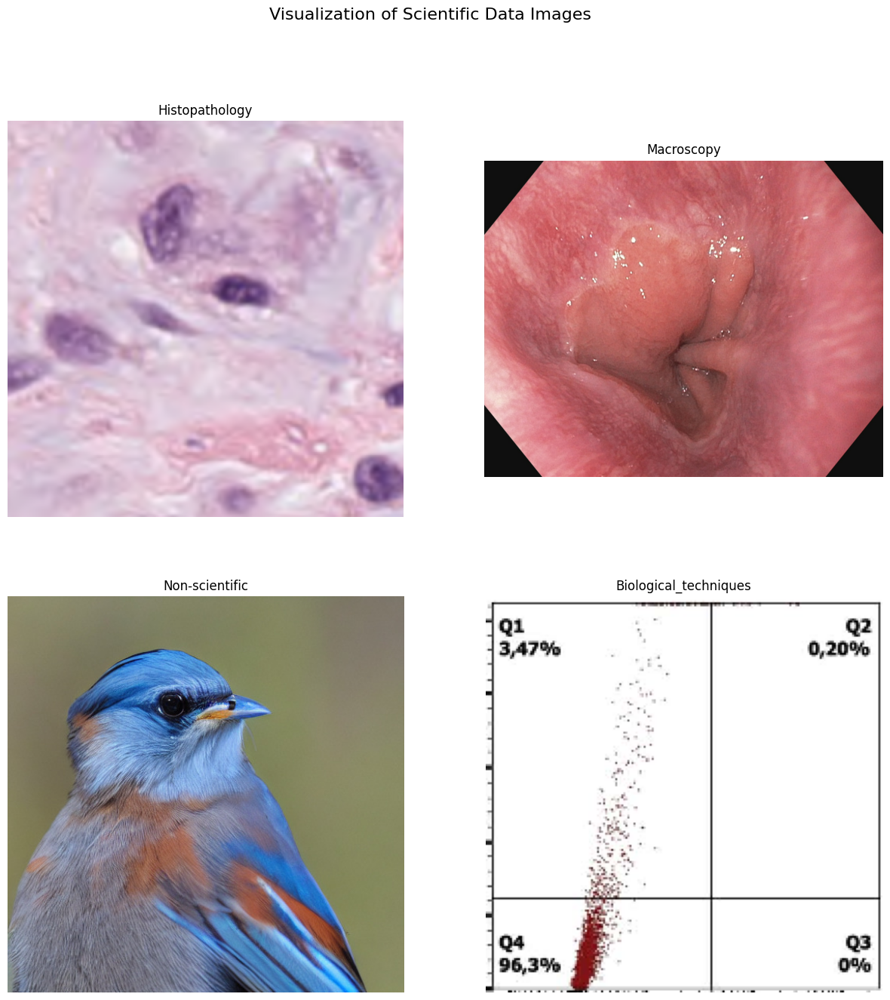

In [ ]:
data_dir = "data/"

class_names = os.listdir(data_dir)

# **1.4 Visualizeing Images**
plt.figure(figsize=(15, 15))
for i, class_name in enumerate(class_names):
    # Get images from each class
    images = os.listdir(os.path.join(data_dir, class_name))

    # Selecting random image
    random_image_index = np.random.randint(0, len(images))
    image_path = os.path.join(data_dir, class_name, images[random_image_index])

    image = plt.imread(image_path)
    plt.subplot(2, 2, i + 1)
    plt.imshow(image)
    plt.title(class_name)
    plt.axis("off")

plt.suptitle("Visualization of Scientific Data Images", fontsize=16)
plt.show()


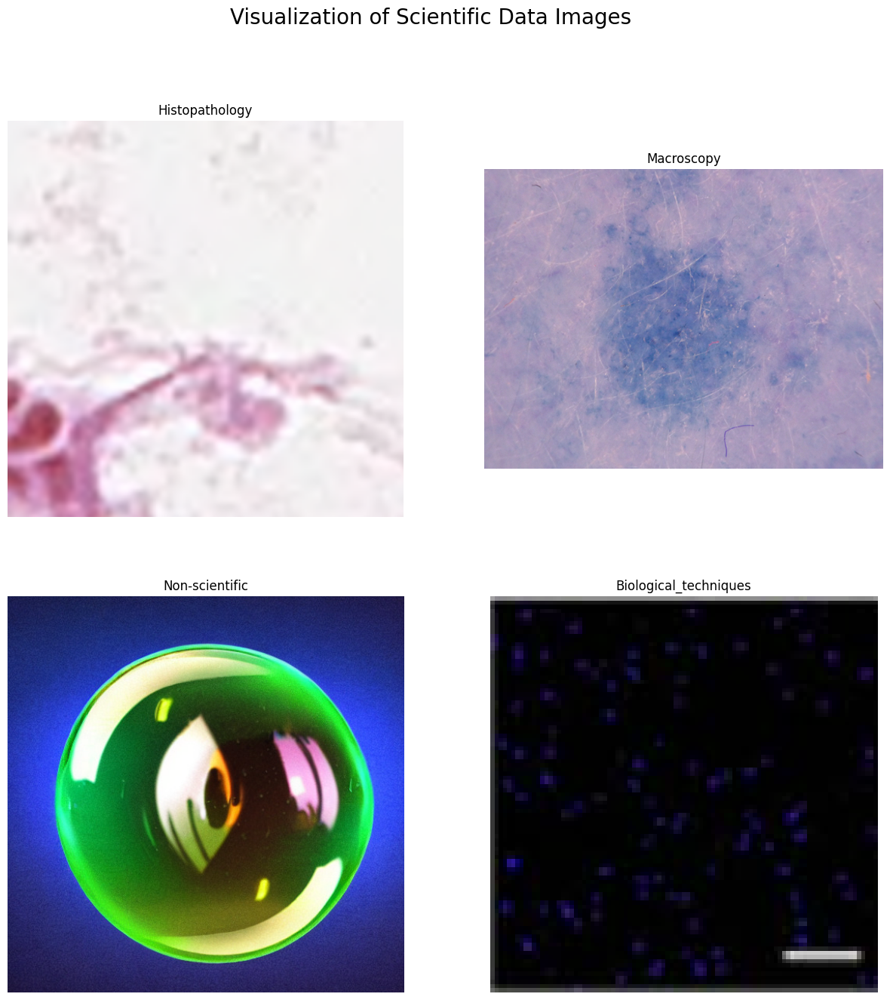

In [ ]:
import os

import cv2
# Load the data from the directory
data_dir = 'data/scientific_data'
classes = os.listdir(data_dir)

# Create a figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 15))

# Iterate through each class and plot images
for i, cls in enumerate(classes):
    # Getting the images in the class directory
    class_dir = os.path.join(data_dir, cls)
    images = os.listdir(class_dir)

    # Selecting a random image from the class
    random_image = images[random.randint(0, len(images) - 1)]
    image_path = os.path.join(class_dir, random_image)

    # Loading and displaying the image
    image = cv2.imread(image_path)
    axs[i // 2, i % 2].imshow(image)
    axs[i // 2, i % 2].set_title(cls)
    axs[i // 2, i % 2].axis('off')

# Show the plot
plt.suptitle('Visualization of Scientific Data Images', fontsize=20)
plt.show()

### **2.  Data Preprocessing**

##### **Check Corrupted Images**

In [ ]:
def check_corrupted_images(image_path):
    corrupted_images = []
    for folder in os.listdir(image_path):
        folder_path = os.path.join(image_path, folder)
        if os.path.isdir(folder_path):  # Check if it's a directory
            for image_file in os.listdir(folder_path):
                image_file_path = os.path.join(folder_path, image_file)
                try:
                    image = cv2.imread(image_file_path)
                    if image is None:
                        corrupted_images.append(image_file_path)
                except Exception as e:
                    print(f"Error processing {image_file_path}: {e}")
                    corrupted_images.append(image_file_path)
    return corrupted_images

image_path = "data/" 
corrupted_images = check_corrupted_images(image_path)

if len(corrupted_images) > 0:
    print("Corrupted images found:")
    for image_path in corrupted_images:
        print(image_path)
else:
    print("No corrupted images found.")


No corrupted images found.


### **Data augmentation**

In [9]:
# Data augmentation sequence
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.2),
    layers.RandomBrightness(0.2)
])

### **Preparing data**

In [10]:


# Defining the directory containing the data
data_dir = 'data'

# Setting a fixed seed for both original and augmented generators
seed = 123

img_height, img_width = 180, 180
# Batch size
batch_size = 16

# Creating data generator for both training and validation sets with data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.1,
    preprocessing_function=data_augmentation
)

# Creating a new generator for augmented images with the same seed
augmented_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    seed=seed  # Set the seed for reproducibility
)


# Generating batches of training data
train_ds = train_datagen.flow_from_directory(
    data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    seed=seed
)

# Generating batches of validation data
val_ds = train_datagen.flow_from_directory(
    data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Displaying the number of samples in each set
print("Number of training samples:", train_ds.samples)
print("Number of validation samples:", val_ds.samples)


Found 17204 images belonging to 2 classes.
Found 17204 images belonging to 2 classes.
Found 1911 images belonging to 2 classes.
Number of training samples: 17204
Number of validation samples: 1911


# **Visualizing Augmented Image**

Biological_techniques				Macroscopy					Histopathology				Non-scientific


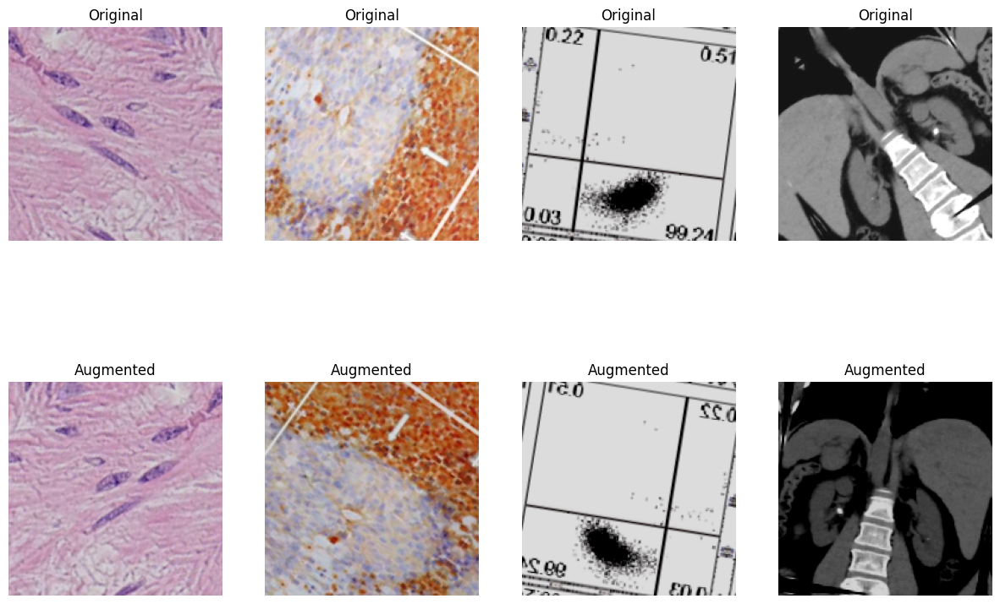

In [ ]:
print("Biological_techniques\t\t\t\tMacroscopy\t\t\t\t\tHistopathology\t\t\t\tNon-scientific")
# Function to visualize original and augmented images
def visualize_original_and_augmented(original_generator, augmented_generator, num_images=4, augmented_index=0):
    plt.figure(figsize=(15, 10))
    for i in range(num_images):
        # Generating a batch of original images
        original_images, _ = next(original_generator)
        # Generate a batch of augmented images (fetch the nth batch)
        for _ in range(augmented_index):
            next(augmented_generator)
        augmented_images, _ = next(augmented_generator)


        plt.subplot(2, num_images, i + 1)
        plt.imshow(original_images[0])  # Display the first image in the batch
        plt.title("Original")
        plt.axis("off")

        # Plotting augmented image
        plt.subplot(2, num_images, num_images + i + 1)
        plt.imshow(augmented_images[0])  # Display the first image in the batch
        plt.title("Augmented")
        plt.axis("off")

# Visualizing original and augmented images
visualize_original_and_augmented(train_ds, augmented_generator)
plt.show()

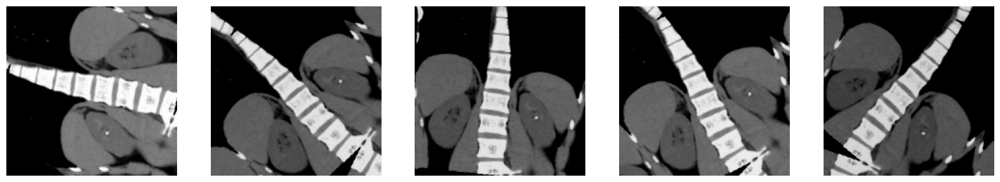

In [ ]:
# Generating some augmented images
augmented_images = [train_ds[0][0][2] for _ in range(5)]  # Generate 5 augmented images

fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i, image in enumerate(augmented_images):
    axes[i].imshow(image)
    axes[i].axis('off')

plt.show()

**Non-scientific Image**

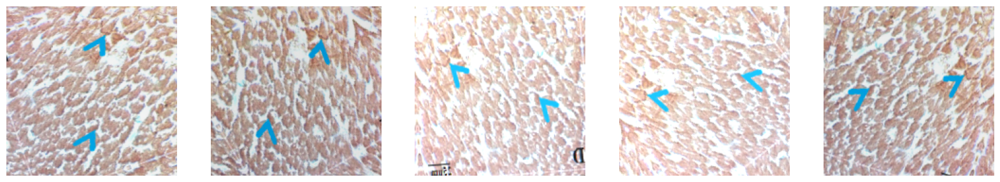

In [ ]:
# Generating some augmented images
augmented_images = [train_ds[0][0][3] for _ in range(5)]  # Generate 5 augmented images

# Plotting the augmented images
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i, image in enumerate(augmented_images):
    axes[i].imshow(image)
    axes[i].axis('off')

plt.show()

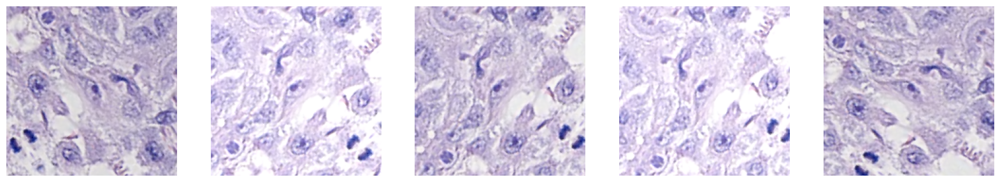

In [ ]:
# Generating some augmented images
augmented_images = [train_ds[0][0][4] for _ in range(5)]  # Generate 5 augmented images

# Plotting the augmented images
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i, image in enumerate(augmented_images):
    axes[i].imshow(image)
    axes[i].axis('off')

plt.show()

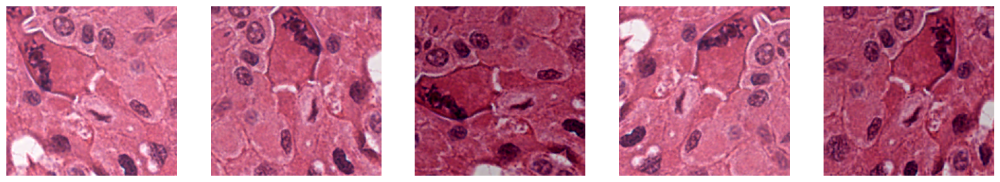

In [ ]:
# Generating some augmented images
augmented_images = [train_ds[0][0][5] for _ in range(5)]  # Generate 5 augmented images

# Plotting the augmented images
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i, image in enumerate(augmented_images):
    axes[i].imshow(image)
    axes[i].axis('off')

plt.show()

In [ ]:
#print(train_ds.class_names)

**Fully Connected Neural Network Model Creation**

In [ ]:
def create_fc_model(input_shape, num_classes):
  model = Sequential()
  model.add(layers.Dense(128, input_shape=input_shape, activation='relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.Dropout(0.2))
  model.add(layers.Dense(64, activation='relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.Dropout(0.2))
  model.add(layers.Dense(128, activation='relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.Dropout(0.2))
  model.add(layers.Dense(num_classes, activation='relu'))
  return model

In [ ]:
# Model configuration
input_shape = (img_height, img_width, 3)  # assuming RGB images
num_classes = 4

# Creating the model
nn_model = create_fc_model(input_shape, num_classes)

In [ ]:
from tensorflow.keras.optimizers import Adam, RMSprop, SGD, Adagrad, Nadam
from tensorflow.keras.callbacks import EarlyStopping

# Define optimizer choices with different learning rates
optimizer_adam = Adam(learning_rate=0.00001)
optimizer_rmsprop = RMSprop(learning_rate=0.0001)
optimizer_sgd = SGD(learning_rate=0.01, momentum=0.9)
optimizer_adagrad = Adagrad(learning_rate=0.00001)
optimizer_nadam = Nadam(learning_rate=0.0001)

In [ ]:
# Compiling the model with 'adam' optimizer
nn_model.compile(optimizer=optimizer_adam,
                 loss='categorical_crossentropy',
                 metrics=['accuracy'])


In [ ]:
# Summary of the model architecture
nn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 180, 180, 128)     512       
                                                                 
 batch_normalization (BatchN  (None, 180, 180, 128)    512       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 180, 180, 128)     0         
                                                                 
 dense_1 (Dense)             (None, 180, 180, 64)      8256      
                                                                 
 batch_normalization_1 (Batc  (None, 180, 180, 64)     256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 180, 180, 64)     

In [ ]:
# from config.configuration import ModelConfigs  # Importing ModelConfigs class
# model_configs = ModelConfigs()
# model_configs.create_configur(epochs=60,name="nn")

**Callback Setup**

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Defined callbacks including ModelCheckpoint, EarlyStopping, and LearningRateScheduler
checkpoint_callback = ModelCheckpoint(filepath='best_model.h5',
                                      monitor='val_accuracy',
                                      save_best_only=True,
                                      mode='max',
                                      verbose=1)
early_stopping_callback = EarlyStopping(monitor='val_loss',
                                        patience=3,
                                        restore_best_weights=True,
                                        verbose=1)



**Training the Neural Network Model**

In [ ]:
# Increased the number of training epochs to 50
history = nn_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,  # Adjust the number of epochs as needed
    callbacks=[checkpoint_callback, early_stopping_callback],
    verbose=1,
    batch_size=batch_size
)


Epoch 1/50
1075/1075 [==============================] - ETA: 0s - loss: 6.1864 - accuracy: 0.2254
Epoch 1: val_accuracy improved from -inf to 0.23258, saving model to best_model.h5
1075/1075 [==============================] - 348s 316ms/step - loss: 6.1864 - accuracy: 0.2254 - val_loss: 7.9957 - val_accuracy: 0.2326
Epoch 2/50
1075/1075 [==============================] - ETA: 0s - loss: 7.3129 - accuracy: 0.2760
Epoch 2: val_accuracy improved from 0.23258 to 0.23992, saving model to best_model.h5
1075/1075 [==============================] - 346s 322ms/step - loss: 7.3129 - accuracy: 0.2760 - val_loss: 7.5424 - val_accuracy: 0.2399
Epoch 3/50
1075/1075 [==============================] - ETA: 0s - loss: 7.3494 - accuracy: 0.2935
Epoch 3: val_accuracy improved from 0.23992 to 0.29963, saving model to best_model.h5
1075/1075 [==============================] - 335s 312ms/step - loss: 7.3494 - accuracy: 0.2935 - val_loss: 7.7974 - val_accuracy: 0.2996
Epoch 4/50
1075/1075 [==================

**Plotting Training and Validation Metrics**


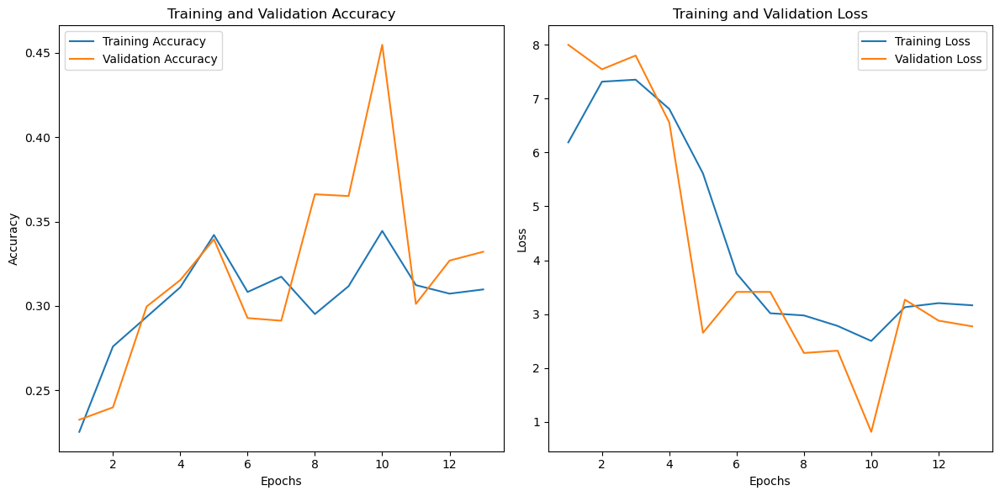

In [ ]:
# Extracting metrics from history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# Determining the actual number of epochs from history
epochs_range = range(1, len(acc) + 1)

# Plotting
plt.figure(figsize=(12, 6))

# Plotting Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plotting Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()


# **CNN**

In [13]:
from keras.models import load_model
model = load_model('Model/image_classification/neuralNetwork/nn_checkpoint_epoch.h5')

**Making Predictions on Random Images**

1/1 [==============================] - 0s 31ms/step


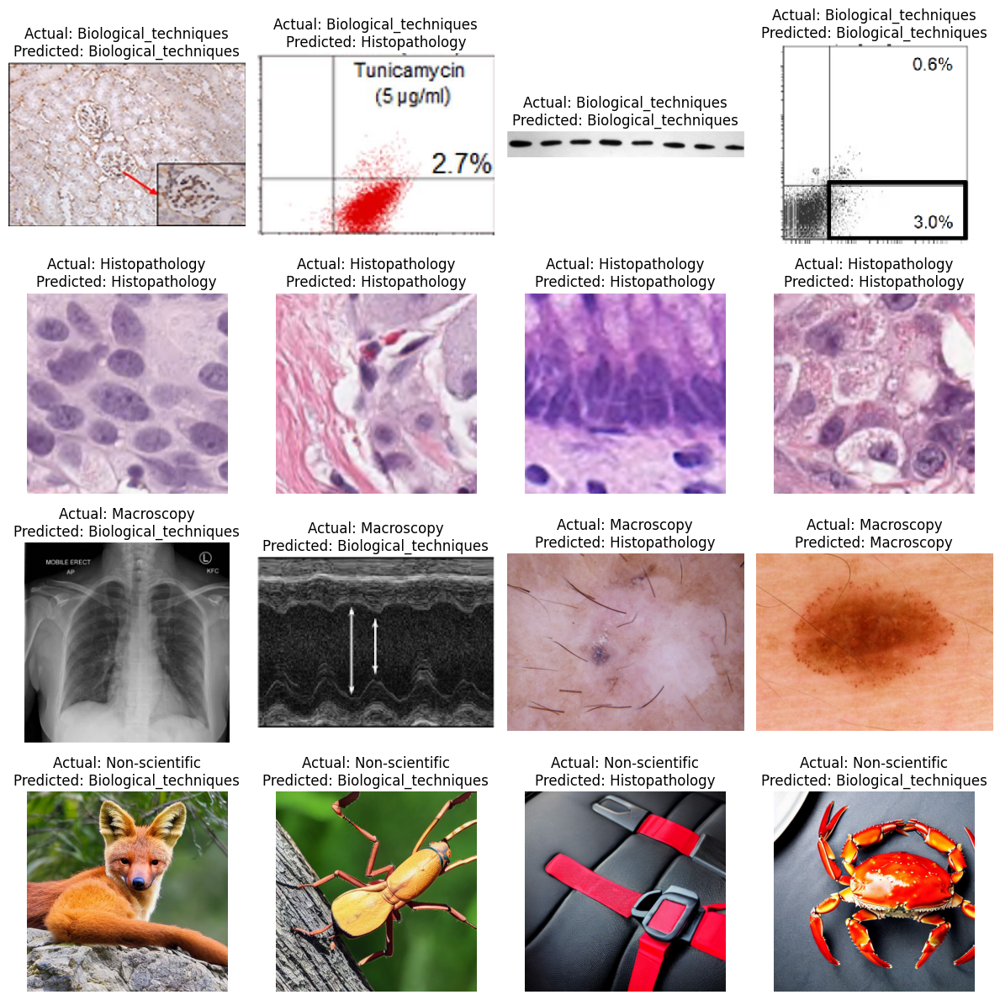

In [15]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

# Loading the trained model

# Defining the directory containing your dataset
dataset_dir = 'data/scientific_data'
# Define a function to preprocess the images
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(img_height, img_width))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Define a function to make predictions on random images from the dataset
def predict_random_images(class_names, num_images_per_class, num_cols):
    num_classes = len(class_names)
    num_rows = int(np.ceil(num_classes * num_images_per_class / num_cols))
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))

    for i, class_name in enumerate(class_names):
        class_dir = os.path.join(dataset_dir, class_name)
        random_image_paths = np.random.choice(os.listdir(class_dir), num_images_per_class, replace=False)
        for j, image_path in enumerate(random_image_paths):
            img_path = os.path.join(class_dir, image_path)
            img_array = preprocess_image(img_path)
            predictions = model.predict(img_array)
            predicted_class = class_names[np.argmax(predictions)]
            actual_class = class_name
            axs[i*num_images_per_class//num_cols + j//num_cols, j % num_cols].imshow(image.load_img(img_path))
            axs[i*num_images_per_class//num_cols + j//num_cols, j % num_cols].set_title(f'Actual: {actual_class}\nPredicted: {predicted_class}')
            axs[i*num_images_per_class//num_cols + j//num_cols, j % num_cols].axis('off')

    plt.tight_layout()
    plt.show()

# Defining the class names
class_names = sorted(os.listdir(dataset_dir))

# Setting the number of random images to predict for each class and the number of columns
num_images_per_class = 4
num_cols = 4

# Making predictions on random images from the dataset
predict_random_images(class_names, num_images_per_class, num_cols)


**Generating a Convolutional Neural Network (CNN) Model**

In [ ]:

from tensorflow.keras.regularizers import l2
def generate_model(input_shape, num_classes, l2_reg=0.01):
    """
    Generates a convolutional neural network (CNN) model.

    Parameters:
        input_shape (tuple): The shape of the input images (height, width, channels).
        num_classes (int): The number of classes for classification.
        l2_reg (float): L2 regularization strength (default: 0.01).

    Returns:
        tf.keras.Sequential: A CNN model configured according to the specified input shape and number of classes.
    """
    model = Sequential([

        layers.Conv2D(filters=64, kernel_size=3,kernel_regularizer=l2(l2_reg), padding='same',input_shape=input_shape, strides=2),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2, strides=2),
        layers.Dropout(0.5),

        layers.Conv2D(filters=32, kernel_size=3,kernel_regularizer=l2(l2_reg), padding='same', strides=2),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2, strides=2),
        layers.Dropout(0.5),

        layers.Conv2D(filters=16, kernel_size=3,kernel_regularizer=l2(l2_reg), padding='same', strides=1),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D(pool_size=2, strides=1),
        layers.Dropout(0.3),

        # Fully connected layers
        layers.Flatten(),
        layers.Dense(units=64, activation='relu', kernel_regularizer=l2(l2_reg)),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model



In [ ]:
input_shape = (img_height, img_width, 3)
num_classes = 4

In [ ]:
model = generate_model(input_shape, num_classes)

In [ ]:
from tensorflow.keras.optimizers import Adam, RMSprop, SGD, Adagrad, Nadam
from tensorflow.keras.callbacks import EarlyStopping
import keras
# Defining optimizer choices with different learning rates
optimizer_adam = Adam(learning_rate=0.00001)
optimizer_rmsprop = RMSprop(learning_rate=0.0001)
optimizer_sgd = SGD(learning_rate=0.01, momentum=0.9)
optimizer_adagrad = Adagrad(learning_rate=0.0001)
optimizer_nadam = Nadam(learning_rate=0.0001)

In [ ]:
"""Custom loss function for my model.

This loss function is a categorical crossentropy loss with label smoothing.

:param y_true: True labels.
:type y_true: tf.Tensor
:param y_pred: Predicted labels.
:type y_pred: tf.Tensor
:returns: The loss value.
:rtype: tf.Tensor
"""
loss = keras.losses.CategoricalCrossentropy(
    from_logits=False,
    label_smoothing=0.1,
    axis=-1,
    reduction="sum_over_batch_size",
    name="categorical_crossentropy",
)

In [ ]:
from tensorflow.keras.optimizers import Adam, RMSprop
# Defining optimizer with the desired learning rate
model.compile(optimizer=optimizer_adam,
                  loss=loss,
                  metrics=['accuracy'])

In [ ]:
# Print model summary
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_56 (Conv2D)          (None, 90, 90, 64)        1792      
                                                                 
 batch_normalization_56 (Ba  (None, 90, 90, 64)        256       
 tchNormalization)                                               
                                                                 
 activation_53 (Activation)  (None, 90, 90, 64)        0         
                                                                 
 max_pooling2d_56 (MaxPooli  (None, 45, 45, 64)        0         
 ng2D)                                                           
                                                                 
 dropout_61 (Dropout)        (None, 45, 45, 64)        0         
                                                                 
 conv2d_57 (Conv2D)          (None, 23, 23, 32)       

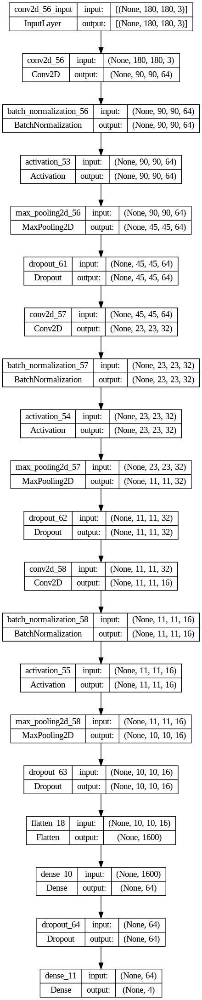

In [ ]:
# Plotting model graph
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [ ]:
val_ds

In [ ]:
from Model.config.configuration import ModelConfigs  # Importing ModelConfigs class
model_configs = ModelConfigs()
model_configs.create_configur(epochs=60,name="cnn")  # Assuming 5 epochs for this example

In [ ]:
# model = load_model("Model/image_classification/cnn_epochs_100/cnn_checkpoint.h5")

**Defining Model Checkpoint for CNN**

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Defining filepath with formatting placeholder for epoch number
filepath = f"{model_configs.model_path}/checkpoint.h5"

# Defining callbacks
checkpoint_callback = ModelCheckpoint(filepath=filepath,
                                      monitor='val_accuracy',
                                      save_best_only=True,
                                      mode='max',overwrite=True,verbose=1)
early_stopping_callback = EarlyStopping(monitor='val_loss',
                                        patience=3,
                                        mode='min',
                                        restore_best_weights=True,verbose=1)


**Training the CNN Model**

In [ ]:
# Use the GPU device for TensorFlow operations
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=60,
    steps_per_epoch=100,
    batch_size= 16,
    callbacks=[checkpoint_callback,early_stopping_callback])

Epoch 1/60
100/100 [==============================] - ETA: 0s - loss: 4.1177 - accuracy: 0.2950
Epoch 1: val_accuracy improved from -inf to 0.28115, saving model to Model/image_classification/cnn_epochs_60/checkpoint.h5
100/100 [==============================] - 77s 751ms/step - loss: 4.1177 - accuracy: 0.2950 - val_loss: 3.3180 - val_accuracy: 0.2812
Epoch 2/60
100/100 [==============================] - ETA: 0s - loss: 3.8628 - accuracy: 0.2838
Epoch 2: val_accuracy improved from 0.28115 to 0.33403, saving model to Model/image_classification/cnn_epochs_60/checkpoint.h5
100/100 [==============================] - 72s 728ms/step - loss: 3.8628 - accuracy: 0.2838 - val_loss: 3.3046 - val_accuracy: 0.3340
Epoch 3/60
100/100 [==============================] - ETA: 0s - loss: 3.7208 - accuracy: 0.2869
Epoch 3: val_accuracy improved from 0.33403 to 0.35079, saving model to Model/image_classification/cnn_epochs_60/checkpoint.h5
100/100 [==============================] - 72s 723ms/step - loss: 

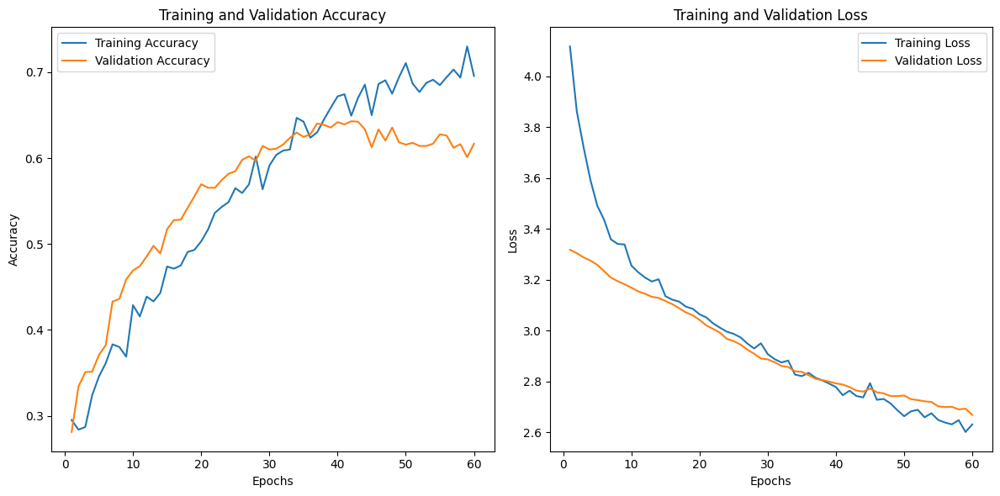

In [ ]:
import matplotlib.pyplot as plt

# Extracting metrics from history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# Determining the actual number of epochs from history
epochs_range = range(1, len(acc) +1)

# Plotting
plt.figure(figsize=(12, 6))

# Plotting Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plotting Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()


**Making Predictions on Random Images**

1/1 [==============================] - 0s 19ms/step


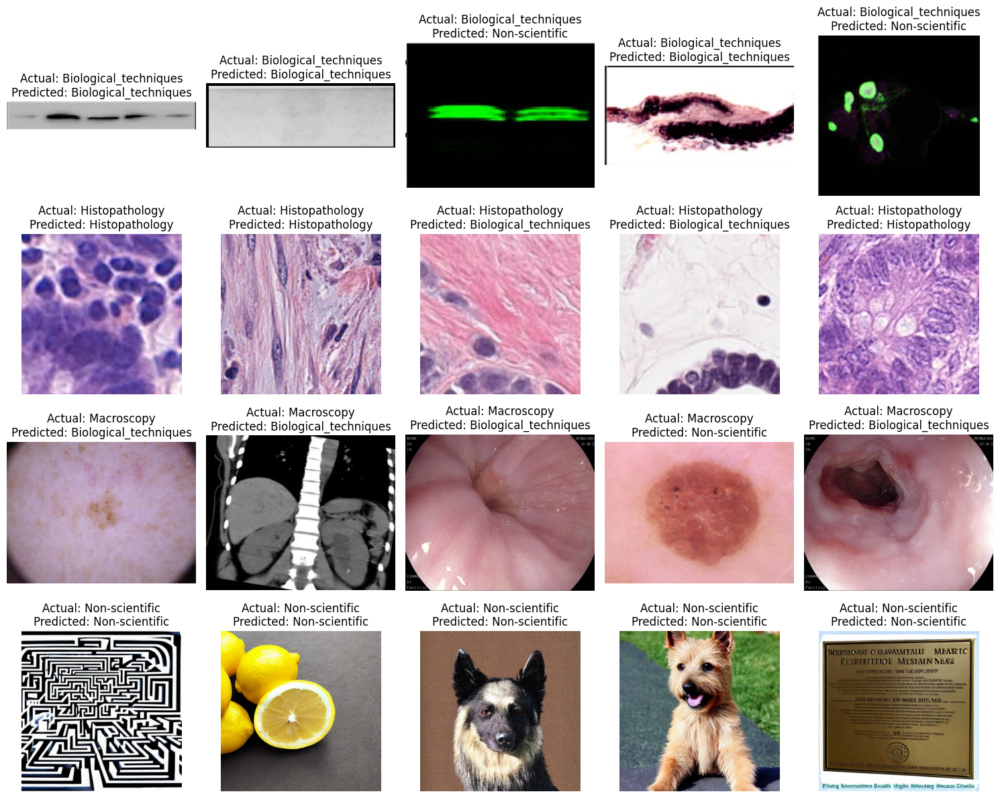

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

# Load the trained model
# model = load_model('.h5')  # Replace 'your_model.h5' with the path to your saved model file


dataset_dir = 'data/scientific_data'
# Defining a function to preprocess the images
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(img_height, img_width))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Defining a function to make predictions on random images from the dataset
def predict_random_images(class_names, num_images_per_class, num_cols):
    num_classes = len(class_names)
    num_rows = int(np.ceil(num_classes * num_images_per_class / num_cols))
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))

    for i, class_name in enumerate(class_names):
        class_dir = os.path.join(dataset_dir, class_name)
        random_image_paths = np.random.choice(os.listdir(class_dir), num_images_per_class, replace=False)
        for j, image_path in enumerate(random_image_paths):
            img_path = os.path.join(class_dir, image_path)
            img_array = preprocess_image(img_path)
            predictions = model.predict(img_array)
            predicted_class = class_names[np.argmax(predictions)]
            actual_class = class_name
            axs[i*num_images_per_class//num_cols + j//num_cols, j % num_cols].imshow(image.load_img(img_path))
            axs[i*num_images_per_class//num_cols + j//num_cols, j % num_cols].set_title(f'Actual: {actual_class}\nPredicted: {predicted_class}')
            axs[i*num_images_per_class//num_cols + j//num_cols, j % num_cols].axis('off')

    plt.tight_layout()
    plt.show()

class_names = sorted(os.listdir(dataset_dir))

num_images_per_class = 5
num_cols = 5

# Make predictions on random images from the dataset
predict_random_images(class_names, num_images_per_class, num_cols)


**Generating Classification Report for Model Evaluation**

In [ ]:
from sklearn.metrics import classification_report


# to Get true labels from the validation dataset
true_labels = []
for i in range(len(val_ds)):
    batch_x, batch_y = val_ds[i]
    true_labels.extend(np.argmax(batch_y, axis=1))

true_labels = np.array(true_labels)

# Making predictions on the validation dataset
predictions = model.predict(val_ds)

# Converting predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Getting class names from the generator
class_names = val_ds.class_indices.keys()

# Generating classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)


120/120 [==============================] - 37s 309ms/step


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

**lotting Confusion Matrix for Model Evaluation**

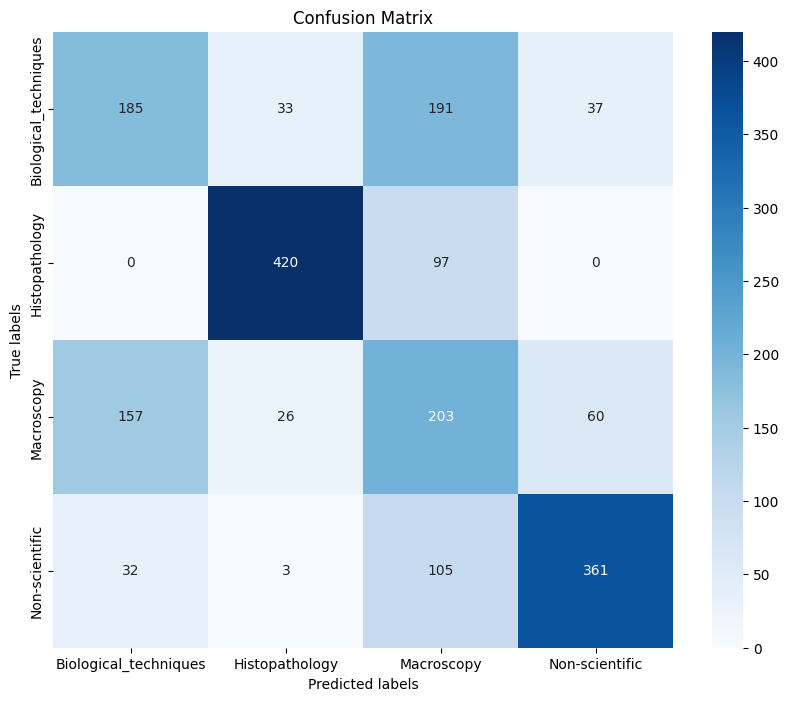

In [ ]:
# Plot confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

## Task4: **Transfer learning**

**Importing Necessary libraries**

In [ ]:
from tensorflow.keras.optimizers import Adam,Adagrad
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from tensorflow.keras import Model

# Defining optimizer with the desired learning rate
optimizer = Adam(learning_rate=0.00001)

model_resnet.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
from Model.config.configuration import ModelConfigs  # Importing ModelConfigs class
model_configs = ModelConfigs()
model_configs.create_configur(epochs=30,name="transfer_learning")  #

In [ ]:
# Debug print
print("Checkpoint filepath:", model_configs.model_path)

Checkpoint filepath: Model/image_classification/transfer_learning_epochs_30


**Defining Model Checkpoint and Early Stopping Callbacks**

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Define filepath with formatting placeholder for epoch number
filepath = f"{model_configs.model_path}/checkpoint_epoch.h5"

# Define callbacks
checkpoint_callback = ModelCheckpoint(filepath=filepath,
                                      monitor='val_accuracy',
                                      save_best_only=True,
                                      mode='max',overwrite=True,verbose=1)
early_stopping_callback = EarlyStopping(monitor='val_accuracy',
                                        patience=3,
                                        mode='max',
                                        restore_best_weights=True,verbose=1)


In [ ]:
# Loading a pre-trained model
base_model = VGG16(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

In [ ]:

# Create new top layers for classification
inputs = Input(shape=(img_height, img_width, 3))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(4, activation='softmax')(x)

# Combining the base model and new top layers
model = Model(inputs, outputs)

In [ ]:
from tensorflow.keras.optimizers import Adam, RMSprop, SGD, Adagrad, Nadam,Adagrad
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
# to Define optimizer choices with different learning rates
optimizer_adam = Adam(learning_rate=0.00001)
optimizer_rmsprop = RMSprop(learning_rate=0.0001)
optimizer_sgd = SGD(learning_rate=0.01, momentum=0.9)
optimizer_adagrad = Adagrad(learning_rate=0.00001)
optimizer_nadam = Nadam(learning_rate=0.000001)

In [ ]:
model.compile(optimizer=optimizer_adagrad, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 4)                 2052      
                                                                 
Total params: 14716740 (56.14 MB)
Trainable params: 14716740 (56.14 MB)
Non-trainable params: 0 (0.00 Byte)
___________________

**Training the CNN model**

In [ ]:
# Continue training the model
history_fine = model.fit(train_ds,
                         validation_data=val_ds,
                         epochs=40,
                         callbacks=[checkpoint_callback,early_stopping_callback],
                         batch_size=16,
                         steps_per_epoch=100)

Epoch 1/40
100/100 [==============================] - ETA: 0s - loss: 1.3979 - accuracy: 0.3444
Epoch 1: val_accuracy improved from -inf to 0.43351, saving model to Model/image_classification/transfer_learning_epochs_30/checkpoint_epoch.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


100/100 [==============================] - 342s 3s/step - loss: 1.3979 - accuracy: 0.3444 - val_loss: 1.3339 - val_accuracy: 0.4335
Epoch 2/40
100/100 [==============================] - ETA: 0s - loss: 1.3760 - accuracy: 0.3550
Epoch 2: val_accuracy improved from 0.43351 to 0.44346, saving model to Model/image_classification/transfer_learning_epochs_30/checkpoint_epoch.h5
100/100 [==============================] - 326s 3s/step - loss: 1.3760 - accuracy: 0.3550 - val_loss: 1.2864 - val_accuracy: 0.4435
Epoch 3/40
100/100 [==============================] - ETA: 0s - loss: 1.2971 - accuracy: 0.4112
Epoch 3: val_accuracy improved from 0.44346 to 0.46387, saving model to Model/image_classification/transfer_learning_epochs_30/checkpoint_epoch.h5
100/100 [==============================] - 293s 3s/step - loss: 1.2971 - accuracy: 0.4112 - val_loss: 1.2474 - val_accuracy: 0.4639
Epoch 4/40
100/100 [==============================] - ETA: 0s - loss: 1.2695 - accuracy: 0.4338
Epoch 4: val_accuracy 

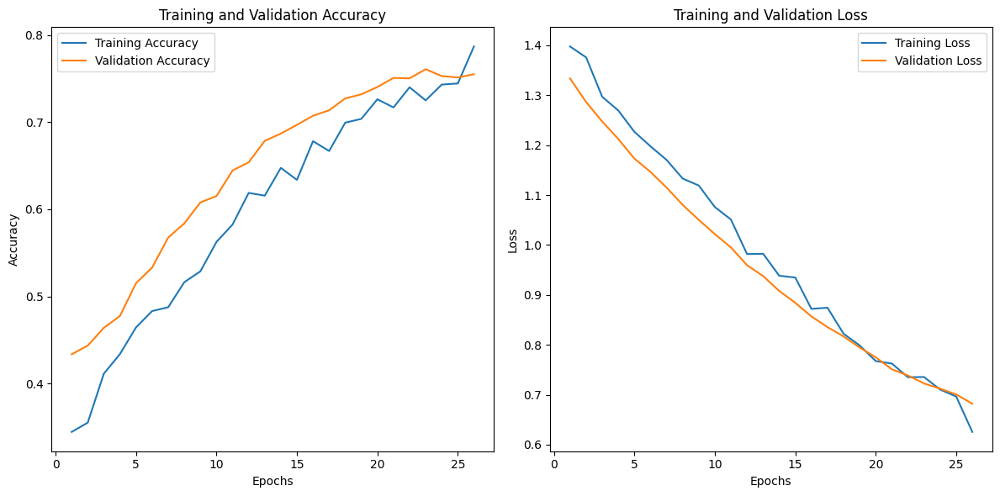

In [ ]:
import matplotlib.pyplot as plt

# Extracting metrics from history
acc = history_fine.history['accuracy']
val_acc = history_fine.history['val_accuracy']
loss = history_fine.history['loss']
val_loss = history_fine.history['val_loss']

# Determine the actual number of epochs from history
epochs_range = range(1, len(acc) +1)

# Plotting
plt.figure(figsize=(12, 6))

# Plotting Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plotting Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()


**Making Predictions on Random Images from the Dataset Using the Trained Model**

1/1 [==============================] - 0s 365ms/step


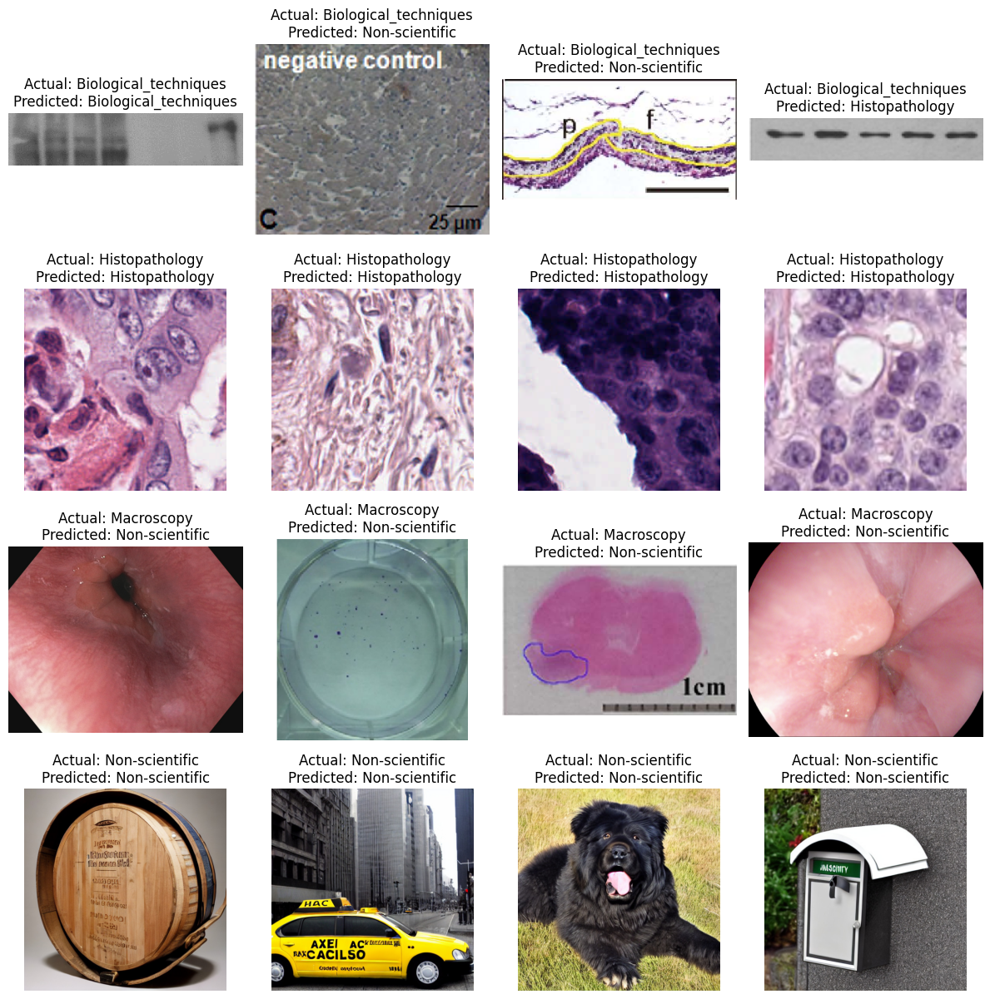

In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

# Loading the trained model
model = load_model('Model/image_classification/transfer_learning_epochs_30/checkpoint_epoch.h5')

# Defining the directory containing your dataset
dataset_dir = 'data/scientific_data'
# Define a function to preprocess the images
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(img_height, img_width))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Defining a function to make predictions on random images from the dataset
def predict_random_images(class_names, num_images_per_class, num_cols):
    num_classes = len(class_names)
    num_rows = int(np.ceil(num_classes * num_images_per_class / num_cols))
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))

    for i, class_name in enumerate(class_names):
        class_dir = os.path.join(dataset_dir, class_name)
        random_image_paths = np.random.choice(os.listdir(class_dir), num_images_per_class, replace=False)
        for j, image_path in enumerate(random_image_paths):
            img_path = os.path.join(class_dir, image_path)
            img_array = preprocess_image(img_path)
            predictions = model.predict(img_array)
            predicted_class = class_names[np.argmax(predictions)]
            actual_class = class_name
            axs[i*num_images_per_class//num_cols + j//num_cols, j % num_cols].imshow(image.load_img(img_path))
            axs[i*num_images_per_class//num_cols + j//num_cols, j % num_cols].set_title(f'Actual: {actual_class}\nPredicted: {predicted_class}')
            axs[i*num_images_per_class//num_cols + j//num_cols, j % num_cols].axis('off')

    plt.tight_layout()
    plt.show()

# Defining the class names
class_names = sorted(os.listdir(dataset_dir))

# Setting the number of random images to predict for each class and the number of columns
num_images_per_class = 4
num_cols = 4

# Making predictions on random images from the dataset
predict_random_images(class_names, num_images_per_class, num_cols)


**Generating Classification Report**

In [ ]:
import numpy as np
from sklearn.metrics import classification_report


# to Get true labels from the validation dataset
true_labels = []
for i in range(len(val_ds)):
    batch_x, batch_y = val_ds[i]
    true_labels.extend(np.argmax(batch_y, axis=1))

true_labels = np.array(true_labels)

# Making predictions on the validation dataset
predictions = model.predict(val_ds)

# to Convert predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Getting class names from the generator
class_names = val_ds.class_indices.keys()

# Generating classification report
report = classification_report(true_labels, predicted_labels, target_names=class_names)


120/120 [==============================] - 45s 375ms/step


In [ ]:
print(report)

                       precision    recall  f1-score   support

Biological_techniques       0.66      0.71      0.68       446
       Histopathology       0.85      0.97      0.91       517
           Macroscopy       0.68      0.37      0.48       446
       Non-scientific       0.75      0.89      0.81       501

             accuracy                           0.75      1910
            macro avg       0.73      0.74      0.72      1910
         weighted avg       0.74      0.75      0.73      1910



**Plotting confusion matrix**

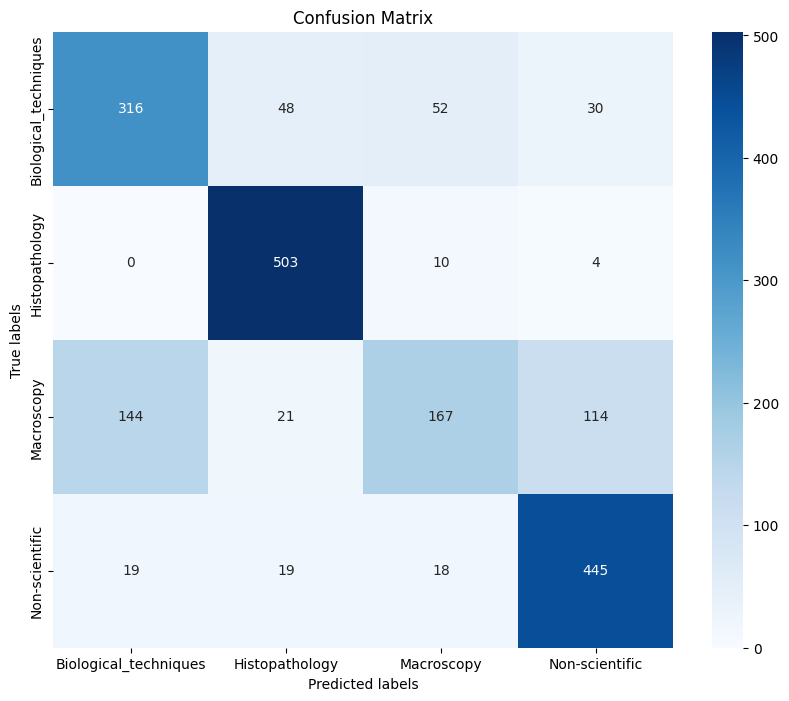

In [ ]:
cm = confusion_matrix(true_labels, predicted_labels)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# **Final Evaluation**

In [ ]:
# to Get true labels from the validation dataset
true_labels = []
for i in range(len(val_ds)):
    batch_x, batch_y = val_ds[i]
    true_labels.extend(np.argmax(batch_y, axis=1))

true_labels = np.array(true_labels)

In [ ]:
true_labels

array([0, 1, 1, ..., 2, 2, 2], dtype=int64)

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

nn = "Model/image_classification/neuralNetwork/nn_checkpoint_epoch.h5"
cnn = "Model/image_classification/cnn_epochs_60/checkpoint.h5"
transfer = "Model/image_classification/transfer_learning_epochs_30/checkpoint_epoch.h5"

# Loading the saved models
model_files = [nn, cnn, transfer]
models = []

models = [load_model(file,compile=False) for file in model_files]

**Generating Classification Reports and Confusion Matrices for all the Models**

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Initializing lists to store classification reports and confusion matrices for each model
reports = []
conf_matrices = []

# Making predictions on the validation dataset and compute metrics for each model
for model in models:
    predictions = model.predict(val_ds)  # Predict probabilities

    # Convert probabilities to class labels
    predicted_labels = np.argmax(predictions, axis=1)

    # Generate classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_names)
    reports.append(report)

    # Generate confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)
    conf_matrices.append(conf_matrix)

#to Print classification reports for each model
for i, report in enumerate(reports):
    print(f"Classification Report for Model {i+1}:")
    print(report)
    print()

120/120 [==============================] - 41s 344ms/step
Classification Report for Model 1:
                       precision    recall  f1-score   support

Biological_techniques       0.23      0.18      0.20       445
       Histopathology       0.27      0.28      0.27       517
           Macroscopy       0.26      0.07      0.11       446
       Non-scientific       0.25      0.45      0.32       501

             accuracy                           0.25      1909
            macro avg       0.25      0.24      0.23      1909
         weighted avg       0.25      0.25      0.23      1909


Classification Report for Model 2:
                       precision    recall  f1-score   support

Biological_techniques       0.14      0.03      0.05       445
       Histopathology       0.27      0.30      0.28       517
           Macroscopy       0.25      0.43      0.32       446
       Non-scientific       0.25      0.24      0.24       501

             accuracy                          

#### **For testing If Model exists**

In [ ]:
model_files = [nn, cnn, transfer]

# to Check if the files exist
for file_path in model_files:
    if not os.path.isfile(file_path):
        print(f"Error: File {file_path} does not exist.")
        exit(1)
    else:
        print(f"File {file_path} exists.")


File Model/image_classification/neuralNetwork/nn_checkpoint_epoch.h5 exists.
File Model/image_classification/cnn_epochs_60/checkpoint.h5 exists.
File Model/image_classification/transfer_learning_epochs_30/checkpoint_epoch.h5 exists.
